#TIME SERIES ANALYSIS

#Goal: Find outliers, trends and periodicity in the MTA turnstile data
    

##DATA:
MTA subway fares. It is a complete dataset of
rides logged by card swipes for 600 Manhattan stations.

The data was organized  by Sina Kashuk at CUSP. You can get it in the github repo as well as here: http://cosmo.nyu.edu/~fb55/UI_CUSP_2015/data/MTA_Fare.npy. 

It contains 23 different subway card types 
(e.g. monthly pass, daily pass, Act for Disability pass…) as follows:



#Task 1: 
##Event detection: Identify the most prominent event. There is a very significant drop (>3-sigma) in all time series.
##Identify it and figure out what it is due to.

 

In [1]:
__author__ = 'Sachin Verma'
import pylab as pl
import pandas as pd
import os
import json



s = json.load(open(os.getenv('PUI2015')+'/fbb_matplotlibrc.json'));
pl.rcParams.update(s)

%pylab inline


Populating the interactive namespace from numpy and matplotlib


/Users/sachinv/anaconda3/lib/python3.4/site-packages/matplotlib/__init__.py:855: UserWarning: svg.embed_char_paths is deprecated and replaced with svg.fonttype; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


### Load the MTA data into a numpy array

In [3]:
mta = np.load("MTA_Fare.npy")
print (mta.shape)

(600, 23, 194)


In [4]:
ridetype = np.array(['10t', '14d', '1d', '2t', '30d', '7d', 'ada', 'afas', 'exp','ez',
            'ff','mc','mr','month','rfm','rr','sen','spec','tcmc','t',
            'umlim','xbus','stud'])
ridetype

array(['10t', '14d', '1d', '2t', '30d', '7d', 'ada', 'afas', 'exp', 'ez',
       'ff', 'mc', 'mr', 'month', 'rfm', 'rr', 'sen', 'spec', 'tcmc', 't',
       'umlim', 'xbus', 'stud'], 
      dtype='<U5')

In [9]:
mta = np.where(mta != -1, mta, np.nan)
print(mta.shape)
#print(mta)

(600, 23, 194)


In [10]:
#for x in mta:
#    print(x)

In [11]:
time_range = pd.date_range(pd.datetime(2010,5,21), periods=194, freq='W' )
print(time_range)

DatetimeIndex(['2010-05-23', '2010-05-30', '2010-06-06', '2010-06-13',
               '2010-06-20', '2010-06-27', '2010-07-04', '2010-07-11',
               '2010-07-18', '2010-07-25', 
               ...
               '2013-12-01', '2013-12-08', '2013-12-15', '2013-12-22',
               '2013-12-29', '2014-01-05', '2014-01-12', '2014-01-19',
               '2014-01-26', '2014-02-02'],
              dtype='datetime64[ns]', length=194, freq='W-SUN', tz=None)


In [21]:
mta_timeseries_ridertypes = np.nansum(mta, axis=0)
mta_timeseries_stationtypes = np.nansum(mta, axis=1)
mta_all = np.nansum(mta_timeseries_stationtypes, axis=0)
print (mta_timeseries_ridertypes.shape)
print (mta_timeseries_stationtypes.shape)
print (mta_all.shape)



(23, 194)
(600, 194)
(194,)


###Lets plot the swipes done for Different Ridership types per week 

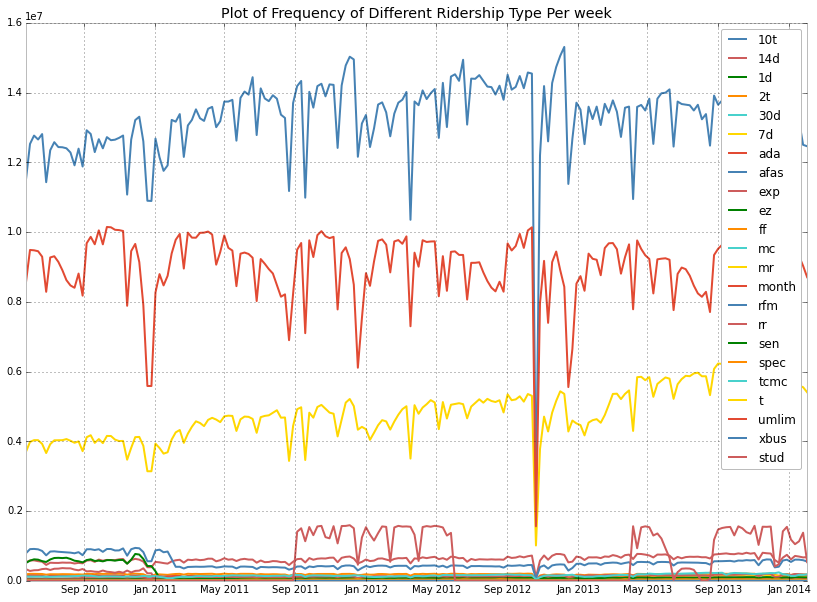

In [127]:
fig = pl.figure(figsize=(14,10))
ax = fig.gca()

for i in range(len(mta_timeseries_ridertypes)):
    pl.plot(time_range, mta_timeseries_ridertypes[i,:], label=ridetype[i])
    pl.legend()
    
pl.title('Plot of Frequency of Different Ridership Type Per week')



###Lets plot the swipes done for Different Ridership types per week on a Log Scale 

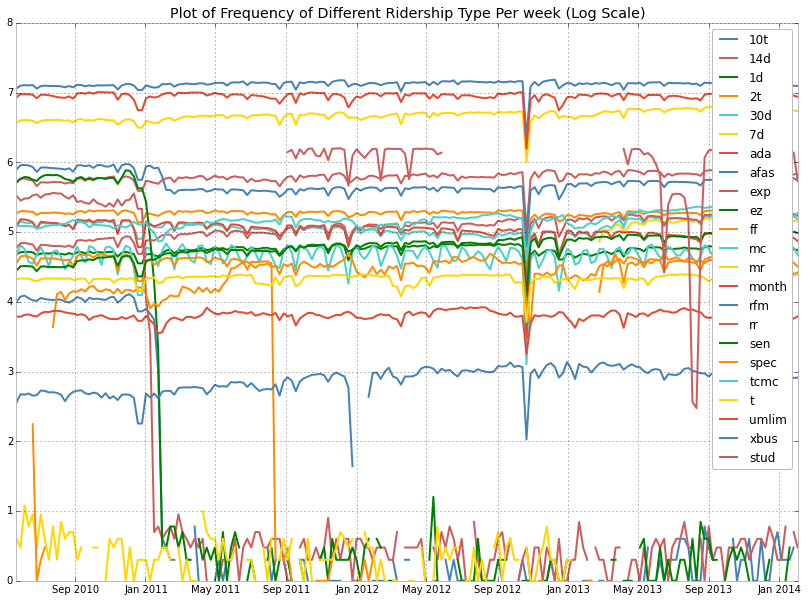

In [131]:
fig = pl.figure(figsize=(14,10))
ax = fig.gca()
import time
for i in range(len(mta_timeseries_ridertypes)):
    pl.plot(time_range, np.log10(mta_timeseries_ridertypes[i,:]),label=ridetype[i])
    pl.legend()
    #pl.draw()
    #time.sleep(0.05)
    #pl.plot(mta_timeseries_ridertypes[i,:])

pl.title('Plot of Frequency of Different Ridership Type Per week (Log Scale)')


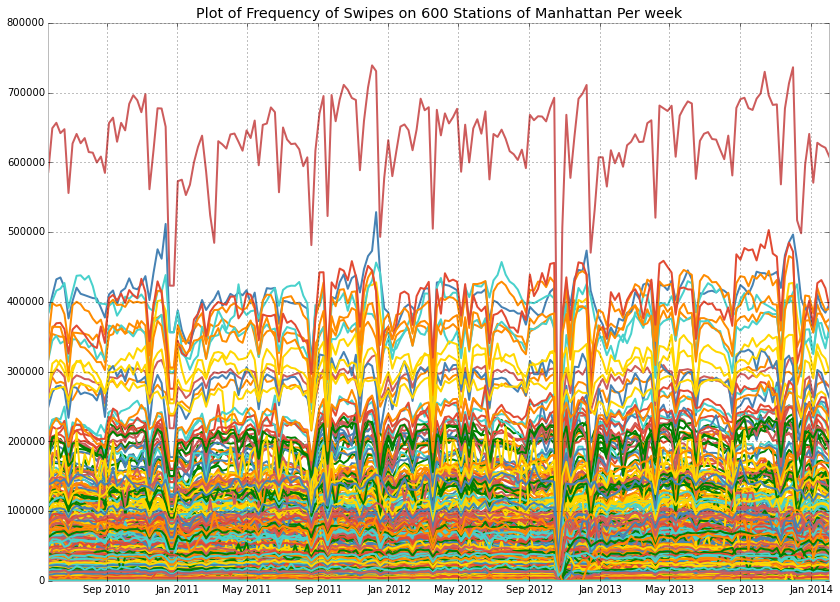

In [130]:
fig = pl.figure(figsize=(14,10))
ax = fig.gca()


for i in range(len(mta_timeseries_stationtypes)):
    pl.plot(time_range, mta_timeseries_stationtypes[i,:])

pl.title('Plot of Frequency of Swipes on 600 Stations of Manhattan Per week')


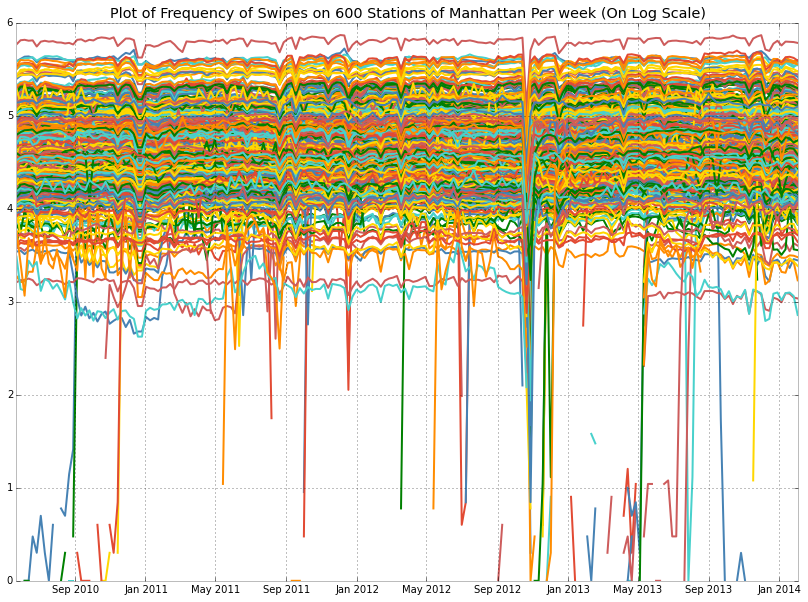

In [132]:
fig = pl.figure(figsize=(14,10))
ax = fig.gca()


for i in range(len(mta_timeseries_stationtypes)):
    pl.plot(time_range, np.log10(mta_timeseries_stationtypes[i,:]))

pl.title('Plot of Frequency of Swipes on 600 Stations of Manhattan Per week (On Log Scale)')


In [39]:
#fig = pl.figure(figsize=(14,10))
#ax = fig.gca()
#pl.plot(time_range, mta_all)

## From the plot of all the card swipes irrespective of station and ridership type, we can see that There is a big dip during October 2012, which corresponds to Hurricane Sandy. 
## Below Plot combines all ridership from stations and ridership and shows a sharp dip around October 2012


29781349.8711
2983960.4217
[38733231.136236683, 20829468.606031362]


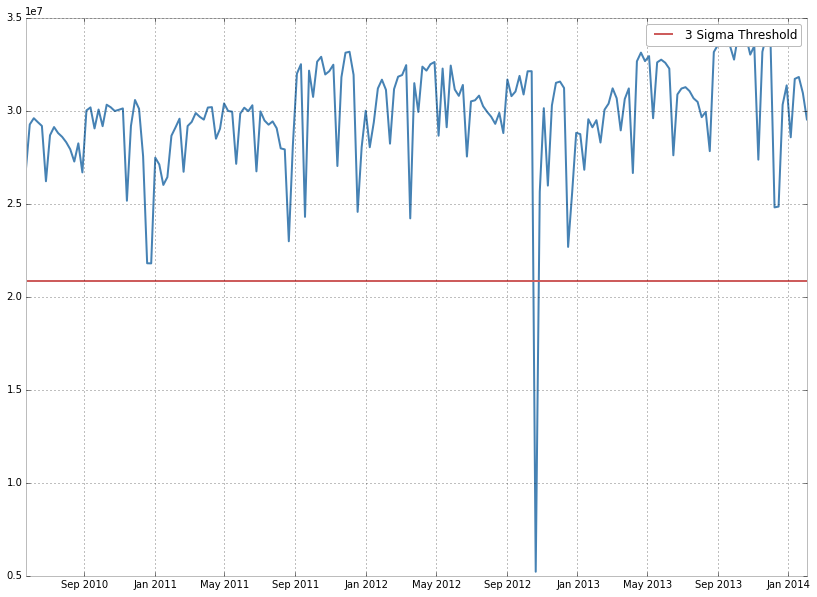

In [133]:

fig = pl.figure(figsize=(14,10))
ax = fig.gca()


print (np.nanmean(mta_all))
print (np.nanstd(mta_all))
#print (mta_all)

thresholds = [np.nanmean(mta_all) + 3 * np.nanstd(mta_all), np.nanmean(mta_all) - 3 * np.nanstd(mta_all)]
print(thresholds)
pl.plot(time_range, mta_all)
pl.plot([pl.xlim()[0], pl.xlim()[1]], [thresholds[1], thresholds[1]], label='3 Sigma Threshold')
pl.legend()


#--------------------------------------------

##Task 2:
###Some of the time series are stationary, some have a complex structure, some show a downward trend: Identify the ridership types that have steadily increased in popularity, and that have steadily decreased. by how much? (e.g what is the ratio of usage in the first 10 and last 10 weeks)
 

### Lets plot all the 23 different Ridership types to spot any trend 

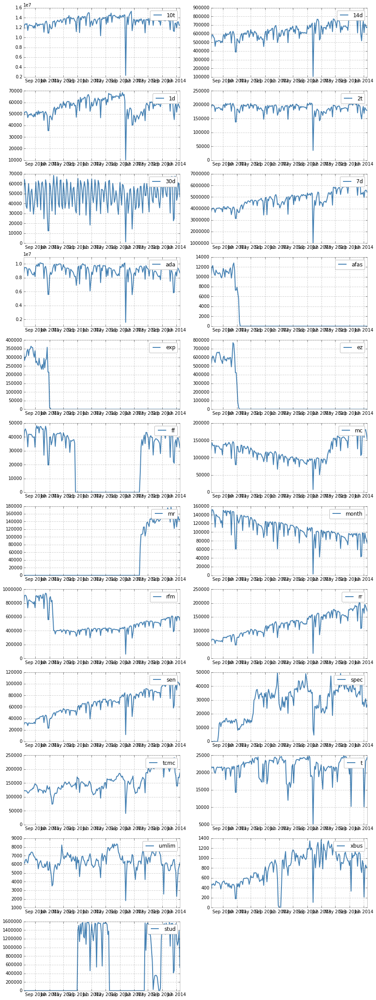

In [108]:
#fig = pl.figure(figsize=(14,10))
#ax = fig.gca()

ax = []
fig = pl.figure(figsize=(14,40))
#ax1 = fig.add_subplot(221)
#ax2 = fig.add_subplot(222)

#pl.setp(rotation=45)

for i in range(len(mta_timeseries_ridertypes)):
    ax.append(fig.add_subplot(12,2,i+1))
#    ax[i].plot(arange(10), mta_timeseries_ridertypes[i,0:10], label=ridetype[i])
#    ax[i].plot(arange(10), mta_timeseries_ridertypes[i,184:], label=ridetype[i])

    ax[i].plot(time_range, mta_timeseries_ridertypes[i,:], label=ridetype[i])
    
    #ax[i].plot(time_range, mta_timeseries_ridertypes[i,:], label=ridetype[i])
    #pl.setp(pl.xticks, rotation=45)


    
    ax[i].legend()





## Senior Ridership has increased over time. - index 16
## Monthly has descresed  - index 13

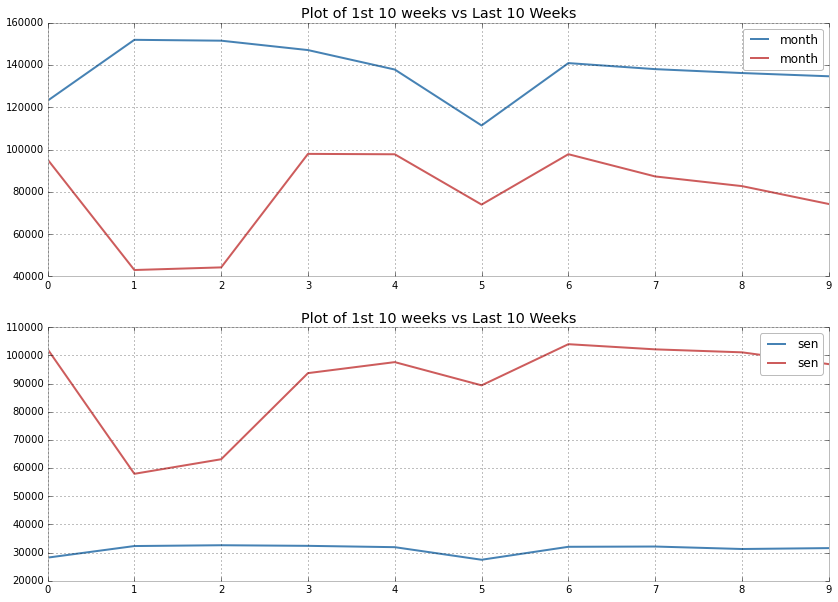

In [134]:
#Senior Ridership has increased over time. 16
#Monthly has descresed 13

ax2 = []
fig = pl.figure(figsize=(14,10))
#ax1 = fig.add_subplot(221)
#ax2 = fig.add_subplot(222)

#pl.setp(rotation=45)
inc_dec = [13,16]
for i in range(len(inc_dec)):
        ax2.append(fig.add_subplot(2,1,i+1))
        ax2[i].plot(arange(10), mta_timeseries_ridertypes[inc_dec[i],0:10], label=ridetype[inc_dec[i]])
        ax2[i].plot(arange(10), mta_timeseries_ridertypes[inc_dec[i],184:], label=ridetype[inc_dec[i]])
        ax2[i].legend()
        pl.title('Plot of 1st 10 weeks vs Last 10 Weeks')








#Task 3:
##Several stations show a prominent annual periodicity. Identify the 4 **stations** (indentify them by the index of their location in the data cube) that show the most prominent periodic trend on an annual period (52 weeks). (Can you figure out what the periodic peak in rides is due to?)

In [119]:
f = np.abs(np.fft.rfft(mta_timeseries_stationtypes[0,:]))
print (f.shape)
ffreq = np.fft.rfftfreq(194, d=1.0)
print(ffreq.shape)


(98,)
(98,)


### Lets plot all 600 plots 

/Users/sachinv/anaconda3/lib/python3.4/site-packages/matplotlib/axes/_axes.py:475: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


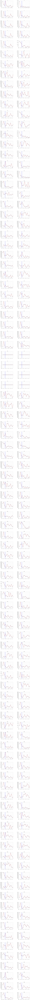

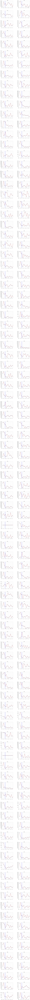

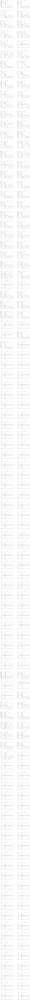

In [143]:
ax3 = []
ax4 = []
ax5 = []
fig = pl.figure(figsize=(14,420))

for i in range(200):
    ax3.append(fig.add_subplot(100,2,i+1))
    ax3[i].legend()

    f = np.abs(np.fft.rfft(mta_timeseries_stationtypes[i,:]))
    ax3[i].plot(np.fft.rfftfreq(194, 1.0)[1:], (f)[1:], 'o', ms = 8)
    ax3[i].set_title("%i" %(i-1))
    ax3[i].plot(np.fft.rfftfreq(194, 1.0)[1:], (f)[1:], '-')
    ax3[i].set_xlim(0,1.0/15)
    ax3[i].axvline(1.0/52)
    pl.subplots_adjust(wspace=.5, hspace=.5, left=.125, right=.9, top=1, bottom=.1)

fig = pl.figure(figsize=(14,420))
   
for i in range(200):
    ax4.append(fig.add_subplot(100,2,i+1))
    ax4[i].legend()

    f = np.abs(np.fft.rfft(mta_timeseries_stationtypes[200+i,:]))
    ax4[i].plot(np.fft.rfftfreq(194, 1.0)[1:], (f)[1:], 'o', ms = 8)
    ax4[i].set_title("%i" %(200+i-1))
    ax4[i].plot(np.fft.rfftfreq(194, 1.0)[1:], (f)[1:], '-')
    ax4[i].set_xlim(0,1.0/15)
    ax4[i].axvline(1.0/52)
    pl.subplots_adjust(wspace=.5, hspace=.5, left=.125, right=.9, top=1, bottom=.1)

fig = pl.figure(figsize=(14,420))

for i in range(200):
    ax5.append(fig.add_subplot(100,2,i+1))
    ax5[i].legend()

    f = np.abs(np.fft.rfft(mta_timeseries_stationtypes[400+i,:]))
    ax5[i].plot(np.fft.rfftfreq(194, 1.0)[1:], (f)[1:], 'o', ms = 8)
    ax5[i].set_title("%i" %(400+i-1))
    ax5[i].plot(np.fft.rfftfreq(194, 1.0)[1:], (f)[1:], '-')
    ax5[i].set_xlim(0,1.0/15)
    ax5[i].axvline(1.0/52)
    pl.subplots_adjust(wspace=.5, hspace=.5, left=.125, right=.9, top=1, bottom=.1)

